In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
pip install pytorch-lightning  

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 585 kB 8.1 MB/s 
     |████████████████████████████████| 419 kB 63.9 MB/s 
     |████████████████████████████████| 140 kB 76.5 MB/s 
     |████████████████████████████████| 596 kB 58.2 MB/s 
     |████████████████████████████████| 1.1 MB 52.4 MB/s 
     |████████████████████████████████| 94 kB 4.1 MB/s 
     |████████████████████████████████| 144 kB 76.0 MB/s 
     |████████████████████████████████| 271 kB 78.8 MB/s 
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [4]:
pip install pytorch-forecasting

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 127 kB 8.7 MB/s 
     |████████████████████████████████| 308 kB 47.6 MB/s 
     |████████████████████████████████| 81 kB 9.5 MB/s 
     |████████████████████████████████| 209 kB 70.2 MB/s 
     |████████████████████████████████| 78 kB 8.4 MB/s 
     |████████████████████████████████| 112 kB 64.9 MB/s 
     |████████████████████████████████| 146 kB 68.1 MB/s 
     |████████████████████████████████| 49 kB 7.5 MB/s 
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11137 sha256=c2bc73d27c7fec09c9a921daf88b8522538ffea54e4b64f0275beec7f0d22206
  Stored in directory: /root/.cache/pip/wheels/9f/18/84/8f69f8b08169c7bae2dde6bd7daf0c19fca8c8e500ee620a28
Successfully built pyperclip


In [5]:
!pip install optuna

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [6]:
import os

import warnings
warnings.filterwarnings('ignore')

import pickle
import joblib
import optuna

import numpy as np
import pandas as pd
from typing import Dict, Callable, List, Optional, Tuple, Union

from sklearn.preprocessing import MinMaxScaler

import matplotlib.pyplot as plt

import torch

import pytorch_lightning as pl

In [7]:
# DeepAR_03 원본 코딩과 다른 부분

from pytorch_lightning.callbacks import EarlyStopping, LearningRateMonitor
from pytorch_lightning.loggers import TensorBoardLogger

logger = TensorBoardLogger('.', name = 'DeepAR')

from pytorch_forecasting import Baseline, DeepAR, TimeSeriesDataSet
from pytorch_forecasting.data import NaNLabelEncoder
from pytorch_forecasting.metrics import SMAPE, DistributionLoss, distributions, BaseEstimator
# 하나의 시계열을 fitting하므로 NormalDistributionLoss이면 됨
from pytorch_forecasting.metrics import NormalDistributionLoss

## Data


In [9]:
data=pd.read_excel('/content/drive/MyDrive/교육/AI실무인증과정/학회 발표/data/data_full.xlsx')
res_data = data[data["Date"].isin(pd.date_range('2016-01-04', '2019-11-30'))]
res_data.reset_index(drop=True, inplace=True)
res_data['time_index'] = np.arange(len(res_data))

In [10]:
res_data.keys()

Index(['Date', 'Account DOW', 'REV OBD', 'OBD NET+FSC_KRW', 'OBD A/R_KRW',
       'REV CPN', 'CPN NET+FSC_KRW', 'CPN A/R_KRW', 'REV TKT',
       'TKT NET+FSC_KRW', 'TKT A/R_KRW', 'WTI', 'exchanges', 'kospi', 'rates',
       'stock_a', 'stock_k', 'stock_kkj', 'time_index'],
      dtype='object')

In [11]:
# Scaling
scaler = MinMaxScaler()
scale_col = ['REV OBD', 'OBD NET+FSC_KRW', 'OBD A/R_KRW', 'REV CPN',
             'CPN NET+FSC_KRW', 'CPN A/R_KRW', 'REV TKT', 'TKT NET+FSC_KRW',
             'TKT A/R_KRW', 'WTI', 'exchanges', 'kospi', 'rates',
             'stock_a', 'stock_k', 'stock_kkj']
scaled = scaler.fit_transform(res_data[scale_col])

In [12]:
scaled.shape

(1427, 16)

In [13]:
tmp_df_1 = res_data[['time_index', 'Date', 'Account DOW']]
columns = ['REV OBD', 'OBD NET+FSC_KRW', 'OBD A/R_KRW', 'REV CPN',
           'CPN NET+FSC_KRW', 'CPN A/R_KRW', 'REV TKT', 'TKT NET+FSC_KRW',
           'TKT A/R_KRW', 'WTI', 'exchanges', 'kospi', 'rates',
           'stock_a', 'stock_k', 'stock_kkj']
tmp_df_2 = pd.DataFrame(scaled, columns=columns)
res_data = pd.concat([tmp_df_1, tmp_df_2], axis=1)
res_data.head()

,time_index,Date,Account DOW,REV OBD,OBD NET+FSC_KRW,OBD A/R_KRW,REV CPN,CPN NET+FSC_KRW,CPN A/R_KRW,REV TKT,TKT NET+FSC_KRW,TKT A/R_KRW,WTI,exchanges,kospi,rates,stock_a,stock_k,stock_kkj
0,0,2016-01-04,MON,0.346259,0.326659,0.374062,0.382432,0.410254,0.477330,0.390738,0.500458,0.532091,0.210159,0.722372,0.109423,0.439024,0.223500,0.211446,0.847607
1,1,2016-01-05,TUE,0.218042,0.241049,0.366526,0.407230,0.432465,0.456675,0.411128,0.506018,0.533700,0.194422,0.722372,0.124851,0.447154,0.200986,0.186607,0.847607
2,2,2016-01-06,WED,0.304836,0.241318,0.282653,0.442056,0.450237,0.373548,0.443735,0.511139,0.532709,0.154582,0.778976,0.118166,0.447154,0.197042,0.175416,0.865189
3,3,2016-01-07,THU,0.293484,0.271334,0.339789,0.528126,0.511364,0.275121,0.530367,0.523532,0.529736,0.140637,0.780054,0.090509,0.447154,0.198028,0.169957,0.794849
4,4,2016-01-08,FRI,0.379972,0.281569,0.278334,0.697807,0.718921,0.392503,0.701510,0.563636,0.534758,0.138446,0.776280,0.107929,0.471545,0.186278,0.136657,0.806574


In [14]:
res_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1427 entries, 0 to 1426
Data columns (total 19 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   time_index       1427 non-null   int64         
 1   Date             1427 non-null   datetime64[ns]
 2   Account DOW      1427 non-null   object        
 3   REV OBD          1427 non-null   float64       
 4   OBD NET+FSC_KRW  1427 non-null   float64       
 5   OBD A/R_KRW      1427 non-null   float64       
 6   REV CPN          1427 non-null   float64       
 7   CPN NET+FSC_KRW  1427 non-null   float64       
 8   CPN A/R_KRW      1427 non-null   float64       
 9   REV TKT          1427 non-null   float64       
 10  TKT NET+FSC_KRW  1427 non-null   float64       
 11  TKT A/R_KRW      1427 non-null   float64       
 12  WTI              1427 non-null   float64       
 13  exchanges        1427 non-null   float64       
 14  kospi            1427 non-null   float64

In [15]:
res_data.describe()

,time_index,REV OBD,OBD NET+FSC_KRW,OBD A/R_KRW,REV CPN,CPN NET+FSC_KRW,CPN A/R_KRW,REV TKT,TKT NET+FSC_KRW,TKT A/R_KRW,WTI,exchanges,kospi,rates,stock_a,stock_k,stock_kkj
count,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000,1427.000000
mean,713.000000,0.360195,0.282904,0.292380,0.314459,0.335520,0.418474,0.320825,0.492223,0.534719,0.552898,0.452095,0.456563,0.516457,0.282264,0.489028,0.467030
std,412.083729,0.149388,0.133402,0.106898,0.198184,0.217978,0.174246,0.200160,0.046340,0.020388,0.191520,0.210885,0.246101,0.253865,0.128560,0.236769,0.226520
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,356.500000,0.252905,0.189293,0.218024,0.074551,0.064994,0.293565,0.078622,0.439682,0.528946,0.433267,0.339623,0.259166,0.308943,0.187223,0.311255,0.331777
50%,713.000000,0.348752,0.267715,0.282006,0.374474,0.404387,0.426462,0.383002,0.505914,0.535830,0.539841,0.423181,0.383492,0.504065,0.244125,0.489673,0.441974
75%,1069.500000,0.456392,0.355028,0.355314,0.443240,0.480351,0.545623,0.452379,0.520757,0.540755,0.683367,0.613208,0.688987,0.707317,0.358833,0.663725,0.623686
max,1426.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [16]:
# time_index에 빈값이 없는지 확인
res_data[['time_index']].isna().sum() 

time_index    0
dtype: int64

In [17]:
res_data['time_index'] = res_data['time_index'].astype(int)

In [18]:
# pytorch_forecasting의 DeepAR에서는 'market' 구분자를 꼭 사용해야 함
res_data['market'] = 'OBD'

In [19]:
def train_model(trial): 
  cfg = {'batch_size' : trial.suggest_categorical('batch_size', [16,32,64,128,256,512]), 
         'seed' : 42, 
         'learning_rate' : trial.suggest_loguniform('learning_rate', 1e-4, 0.1),
         'log_interval' : trial.suggest_int('log_interval', -10, 100, 1),
         'log_val_interval': trial.suggest_int('log_val_interval', -10, 100, 1),
         'hidden_size' : trial.suggest_int('hidden_size', 8, 128),
         'rnn_layers' : trial.suggest_int('rnn_layers',1, 7, 1),
         'max_epochs' : trial.suggest_int('max_epochs', 500, 1500, 100),
         'limit_train_batches' : trial.suggest_int('limit_train_batches', 30, 30),
         'gradient_clip_val' : trial.suggest_loguniform('gradient_clip_val', 1e-4, 0.1),
         'dropout' : trial.suggest_uniform('dropout', 0.1, 0.5)} 
  
  torch.manual_seed(cfg['seed']) 
  
  max_encoder_length = 100  # encoder LSTM에 들어가는 길이
  max_prediction_length = 20  # decoder의 길이
  
  # Training_cutoff는 trainingset을 정하기 위한 기준으로 max_prediction_length만 잘라서는 안될거 같음
  # 일단 데이터 기간의 30%를 validation으로 정의
  training_cutoff = int(res_data['time_index'].max() * .7)
         
  training = TimeSeriesDataSet(
    res_data[lambda x: x.time_index <= training_cutoff],
    time_idx = 'time_index',
    target = 'REV OBD',
    categorical_encoders = {'Account DOW':NaNLabelEncoder().fit(res_data['Account DOW']), 
                            'market':NaNLabelEncoder().fit(res_data['market'])},  # market 컬럼에 nan 값이 있으면 NaNLabelEncoder()로 처리하라는 의미임
    group_ids = ['market'],
    time_varying_unknown_reals = ['REV OBD'],
    # time_varying_known_reals = ['candle_acc_trade_volume'],
    max_encoder_length = max_encoder_length,
    max_prediction_length = max_prediction_length,
    allow_missing_timesteps=True,
  )

  validation = TimeSeriesDataSet.from_dataset(
    training,
    res_data,
    min_prediction_idx = training_cutoff + 1
  )

  train_dataloader = training.to_dataloader(train = True, batch_size = cfg['batch_size'], num_workers = 0)
  val_dataloader = validation.to_dataloader(train = False, batch_size = cfg['batch_size'], num_workers = 0)

  # calculate baseline mean absolute error, i.e. predict next value as the last available value from the history
  actuals = torch.cat([y for x, (y, weight) in iter(val_dataloader)])
  baseline_predictions = Baseline().predict(val_dataloader)
  mae_with_baseline = (actuals - baseline_predictions).abs().mean().item()
  smape_with_baseline = (2 * (baseline_predictions - actuals).abs() / (baseline_predictions.abs() + actuals.abs() + 1e-8)).mean()

  print(f'mae_with_baseline : {mae_with_baseline}')
  print(f'smape_with_baseline : {smape_with_baseline}')

  early_stop_callback = EarlyStopping(monitor='val_loss', min_delta=1e-5, patience=5, verbose=True, mode='min')
  lr_logger = LearningRateMonitor()
  logger = TensorBoardLogger("./lightning_logs/TFT")  # logging results to a tensorboard
  
  net = DeepAR.from_dataset(
    training, 
    learning_rate=cfg['learning_rate'],
    log_interval=cfg['log_interval'],
    log_val_interval=cfg['log_val_interval'],
    hidden_size=cfg['hidden_size'],
    dropout=cfg['dropout'],
    rnn_layers=cfg['rnn_layers'],
    loss = NormalDistributionLoss()   # class가 아닌 함수를 전달해 줘야 함 => 클래스는 맞지만 클래스의 인스턴스가 아니라 클래스 자체를 전달
  )

  trainer = pl.Trainer(
    max_epochs = cfg['max_epochs'],
    gpus = 1,
    weights_summary = 'top',
    gradient_clip_val = cfg['gradient_clip_val'],
    callbacks = [lr_logger, early_stop_callback],
    limit_train_batches = cfg['limit_train_batches'],
    enable_checkpointing = True,
    auto_lr_find = True,
    logger = logger 
  )

  print(f"Number of parameters in network: {net.size()/1e3:.1f}k")
  
  trainer.fit(
    net,
    train_dataloaders = train_dataloader,
    val_dataloaders = val_dataloader,
  )

  best_model_path = trainer.checkpoint_callback.best_model_path
  best_model = net.load_from_checkpoint(best_model_path)

  actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
  predictions = best_model.predict(val_dataloader)

  SMAPE = (2 * (predictions - actuals).abs() / (predictions.abs() + actuals.abs() + 1e-8)).mean()

  # (actuals - predictions).abs().mean()

  return SMAPE

In [ ]:
sampler = optuna.samplers.TPESampler() 

study = optuna.create_study(sampler=sampler, direction='minimize') 
study.optimize(train_model, n_trials=1) 
joblib.dump(study, './deepar_optuna_09.pkl')

[I 2022-06-19 09:27:14,528] A new study created in memory with name: no-name-3dacf978-9529-4f5f-a1d1-49eca025d61b
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


mae_with_baseline : 0.14553165435791016
smape_with_baseline : 0.4221746027469635
Number of parameters in network: 62.1k


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]

  | Name                   | Type                   | Params
------------------------------------------------------------------
0 | loss                   | NormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList             | 0     
2 | embeddings             | MultiEmbedding         | 0     
3 | rnn                    | LSTM                   | 61.9 K
4 | distribution_projector | Linear                 | 144   
------------------------------------------------------------------
62.1 K    Trainable params
0         Non-trainable params
62.1 K    Total params
0.248     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -0.401


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.128 >= min_delta = 1e-05. New best score: -0.529


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.123 >= min_delta = 1e-05. New best score: -0.652


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.013 >= min_delta = 1e-05. New best score: -0.665


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.026 >= min_delta = 1e-05. New best score: -0.690


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.018 >= min_delta = 1e-05. New best score: -0.708


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.029 >= min_delta = 1e-05. New best score: -0.737


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.030 >= min_delta = 1e-05. New best score: -0.767


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.091 >= min_delta = 1e-05. New best score: -0.858


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.063 >= min_delta = 1e-05. New best score: -0.921


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.038 >= min_delta = 1e-05. New best score: -0.958


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.007 >= min_delta = 1e-05. New best score: -0.966


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.028 >= min_delta = 1e-05. New best score: -0.993


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.039 >= min_delta = 1e-05. New best score: -1.033


Validation: 0it [00:00, ?it/s]

[I 2022-06-19 09:28:14,047] Trial 0 finished with value: 0.2726764678955078 and parameters: {'batch_size': 16, 'learning_rate': 0.035109394166981736, 'log_interval': 65, 'log_val_interval': 79, 'hidden_size': 71, 'rnn_layers': 2, 'max_epochs': 800, 'limit_train_batches': 30, 'gradient_clip_val': 0.0021693530728540125, 'dropout': 0.28075004320412456}. Best is trial 0 with value: 0.2726764678955078.


['./deepar_optuna_09.pkl']

In [23]:
study = joblib.load('/content/drive/MyDrive/교육/AI실무인증과정/DeepAR/deepar_optuna_09.pkl') 
df = study.trials_dataframe() 
df.sort_values('value')

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_dropout,params_gradient_clip_val,params_hidden_size,params_learning_rate,params_limit_train_batches,params_log_interval,params_log_val_interval,params_max_epochs,params_rnn_layers,state
0,0,0.269160,2022-06-18 08:51:09.477156,2022-06-18 08:52:47.313474,0 days 00:01:37.836318,128,0.398464,0.015040,69,0.019084,30,25,25,1500,3,COMPLETE
2,2,0.316959,2022-06-18 08:57:10.238819,2022-06-18 09:11:17.856971,0 days 00:14:07.618152,256,0.424615,0.000109,122,0.001714,30,43,91,1100,1,COMPLETE
1,1,0.325715,2022-06-18 08:52:47.315730,2022-06-18 08:57:10.235496,0 days 00:04:22.919766,512,0.466658,0.000259,60,0.008195,30,98,46,900,7,COMPLETE


In [24]:
study.best_params

{'batch_size': 128,
 'dropout': 0.39846391451229257,
 'gradient_clip_val': 0.015040387803909167,
 'hidden_size': 69,
 'learning_rate': 0.01908397496180262,
 'limit_train_batches': 30,
 'log_interval': 25,
 'log_val_interval': 25,
 'max_epochs': 1500,
 'rnn_layers': 3}

In [25]:
optuna.visualization.plot_param_importances(study)

ZeroDivisionError: ignored

In [26]:
optuna.visualization.plot_optimization_history(study)

## Calculate baseline error

In [27]:
# 실제 예측하려는 target 구간의 max_encoder_length : 100일 
test_data = res_data[res_data["Date"].isin(pd.date_range('2019-08-23', '2019-11-30'))]
test_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100 entries, 1327 to 1426
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   time_index       100 non-null    int64         
 1   Date             100 non-null    datetime64[ns]
 2   Account DOW      100 non-null    object        
 3   REV OBD          100 non-null    float64       
 4   OBD NET+FSC_KRW  100 non-null    float64       
 5   OBD A/R_KRW      100 non-null    float64       
 6   REV CPN          100 non-null    float64       
 7   CPN NET+FSC_KRW  100 non-null    float64       
 8   CPN A/R_KRW      100 non-null    float64       
 9   REV TKT          100 non-null    float64       
 10  TKT NET+FSC_KRW  100 non-null    float64       
 11  TKT A/R_KRW      100 non-null    float64       
 12  WTI              100 non-null    float64       
 13  exchanges        100 non-null    float64       
 14  kospi            100 non-null    float

In [28]:
test_data

,time_index,Date,Account DOW,REV OBD,OBD NET+FSC_KRW,OBD A/R_KRW,REV CPN,CPN NET+FSC_KRW,CPN A/R_KRW,REV TKT,TKT NET+FSC_KRW,TKT A/R_KRW,WTI,exchanges,kospi,rates,stock_a,stock_k,stock_kkj,market
1327,1327,2019-08-23,FRI,0.383960,0.380794,0.417535,0.426313,0.490537,0.624780,0.435846,0.522950,0.544481,0.556972,0.838275,0.148143,0.065041,0.423541,0.061960,0.032236,OBD
1328,1328,2019-08-24,SAT,0.399916,0.442512,0.489994,0.066782,0.058733,0.225085,0.072361,0.438647,0.524715,0.556972,0.838275,0.148143,0.065041,0.423541,0.061960,0.032236,OBD
1329,1329,2019-08-25,SUN,0.321750,0.321784,0.390239,0.056137,0.046130,0.167836,0.060209,0.436261,0.523350,0.556972,0.838275,0.148143,0.065041,0.423541,0.061960,0.032236,OBD
1330,1330,2019-08-26,MON,0.255974,0.242164,0.329668,0.350990,0.380163,0.497073,0.361016,0.501224,0.538775,0.546414,0.857143,0.106212,0.024390,0.400000,0.017742,0.010549,OBD
1331,1331,2019-08-27,TUE,0.080121,0.104571,0.268033,0.333189,0.360720,0.496316,0.343248,0.498215,0.539455,0.572112,0.854447,0.117078,0.065041,0.429417,0.006005,0.008209,OBD
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1422,1422,2019-11-26,TUE,0.127450,0.065511,0.145074,0.355746,0.421025,0.684971,0.365824,0.509522,0.546376,0.641434,0.657682,0.374972,0.317073,0.439195,0.221272,0.112549,OBD
1423,1423,2019-11-27,WED,0.236336,0.123995,0.153675,0.375332,0.416889,0.548806,0.385843,0.508997,0.541452,0.635458,0.657682,0.383492,0.300813,0.421569,0.209535,0.104340,OBD
1424,1424,2019-11-28,THU,0.221302,0.124945,0.167785,0.373239,0.435672,0.655080,0.381100,0.512590,0.546047,0.635458,0.665768,0.371368,0.276423,0.413722,0.212447,0.103752,OBD
1425,1425,2019-11-29,FRI,0.408545,0.231449,0.184925,0.438763,0.501738,0.611423,0.448412,0.525936,0.544695,0.576892,0.671159,0.331206,0.243902,0.386278,0.174051,0.109620,OBD


In [29]:
# best_model에 res_data 넣어서 학습 : res_data (2019년 11월 30일까지 데이터)

torch.manual_seed(42) 

max_encoder_length = 100  # encoder LSTM에 들어가는 길이
max_prediction_length = 20  # decoder의 길이

# Training_cutoff는 trainingset을 정하기 위한 기준으로 max_prediction_length만 잘라서는 안될거 같음
# 일단 데이터 기간의 30%를 validation으로 정의
training_cutoff = int(res_data['time_index'].max() * .7)

training = TimeSeriesDataSet(
  res_data[lambda x: x.time_index <= training_cutoff],
  time_idx = 'time_index',
  target = 'REV OBD',
  categorical_encoders = {'Account DOW':NaNLabelEncoder().fit(res_data['Account DOW']), 
                          'market':NaNLabelEncoder().fit(res_data['market'])},  # market 컬럼에 nan 값이 있으면 NaNLabelEncoder()로 처리하라는 의미임
  group_ids = ['market'],
  time_varying_unknown_reals = ['REV OBD'],
  # time_varying_known_reals = ['candle_acc_trade_volume'],
  max_encoder_length = max_encoder_length,
  max_prediction_length = max_prediction_length,
  allow_missing_timesteps=True,
)

validation = TimeSeriesDataSet.from_dataset(
  training,
  res_data,
  min_prediction_idx = training_cutoff + 1
)

train_dataloader = training.to_dataloader(train = True, batch_size = study.best_params['batch_size'], num_workers = 0)
val_dataloader = validation.to_dataloader(train = False, batch_size = study.best_params['batch_size'], num_workers = 0)

# calculate baseline mean absolute error, i.e. predict next value as the last available value from the history
actuals = torch.cat([y for x, (y, weight) in iter(val_dataloader)])
baseline_predictions = Baseline().predict(val_dataloader)
mae_with_baseline = (actuals - baseline_predictions).abs().mean().item()
smape_with_baseline = (2 * (baseline_predictions - actuals).abs() / (baseline_predictions.abs() + actuals.abs() + 1e-8)).mean()

print(f'mae_with_baseline : {mae_with_baseline}')
print(f'smape_with_baseline : {smape_with_baseline}')

early_stop_callback = EarlyStopping(monitor='val_loss', min_delta=1e-5, patience=5, verbose=True, mode='min')
lr_logger = LearningRateMonitor()
logger = TensorBoardLogger("./lightning_logs/TFT")  # logging results to a tensorboard

net = DeepAR.from_dataset(
  training, 
  learning_rate=study.best_params['learning_rate'],
  log_interval=study.best_params['log_interval'],
  log_val_interval=study.best_params['log_val_interval'],
  hidden_size=study.best_params['hidden_size'],
  dropout=study.best_params['dropout'],
  rnn_layers=study.best_params['rnn_layers'],
  loss = NormalDistributionLoss()   # class가 아닌 함수를 전달해 줘야 함 => 클래스는 맞지만 클래스의 인스턴스가 아니라 클래스 자체를 전달
)

trainer = pl.Trainer(
  max_epochs = study.best_params['max_epochs'],
  gpus = 1,
  weights_summary = 'top',
  gradient_clip_val = study.best_params['gradient_clip_val'],
  callbacks = [lr_logger, early_stop_callback],
  limit_train_batches = study.best_params['limit_train_batches'],
  enable_checkpointing = True,
  auto_lr_find = True,
  logger = logger 
)

trainer.fit(
  net,
  train_dataloaders = train_dataloader,
  val_dataloaders = val_dataloader,
)

best_model_path = trainer.checkpoint_callback.best_model_path
best_model = net.load_from_checkpoint(best_model_path)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Missing logger folder: ./lightning_logs/TFT/lightning_logs


mae_with_baseline : 0.14553165435791016
smape_with_baseline : 0.4221746027469635


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                   | Params
------------------------------------------------------------------
0 | loss                   | NormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList             | 0     
2 | embeddings             | MultiEmbedding         | 0     
3 | rnn                    | LSTM                   | 97.2 K
4 | distribution_projector | Linear                 | 140   
------------------------------------------------------------------
97.3 K    Trainable params
0         Non-trainable params
97.3 K    Total params
0.389     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved. New best score: -0.355


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.020 >= min_delta = 1e-05. New best score: -0.375


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.029 >= min_delta = 1e-05. New best score: -0.404


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.034 >= min_delta = 1e-05. New best score: -0.439


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.035 >= min_delta = 1e-05. New best score: -0.474


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.028 >= min_delta = 1e-05. New best score: -0.501


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.006 >= min_delta = 1e-05. New best score: -0.507


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.019 >= min_delta = 1e-05. New best score: -0.526


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.029 >= min_delta = 1e-05. New best score: -0.555


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.049 >= min_delta = 1e-05. New best score: -0.604


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.017 >= min_delta = 1e-05. New best score: -0.621


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.014 >= min_delta = 1e-05. New best score: -0.635


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.009 >= min_delta = 1e-05. New best score: -0.644


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.002 >= min_delta = 1e-05. New best score: -0.647


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.003 >= min_delta = 1e-05. New best score: -0.649


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.008 >= min_delta = 1e-05. New best score: -0.657


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.011 >= min_delta = 1e-05. New best score: -0.668


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.020 >= min_delta = 1e-05. New best score: -0.688


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.027 >= min_delta = 1e-05. New best score: -0.714


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.021 >= min_delta = 1e-05. New best score: -0.736


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.015 >= min_delta = 1e-05. New best score: -0.750


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.018 >= min_delta = 1e-05. New best score: -0.769


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.020 >= min_delta = 1e-05. New best score: -0.789


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.018 >= min_delta = 1e-05. New best score: -0.807


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.019 >= min_delta = 1e-05. New best score: -0.827


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.020 >= min_delta = 1e-05. New best score: -0.847


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.024 >= min_delta = 1e-05. New best score: -0.871


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.023 >= min_delta = 1e-05. New best score: -0.894


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.016 >= min_delta = 1e-05. New best score: -0.910


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.020 >= min_delta = 1e-05. New best score: -0.930


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.022 >= min_delta = 1e-05. New best score: -0.952


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.012 >= min_delta = 1e-05. New best score: -0.963


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.014 >= min_delta = 1e-05. New best score: -0.978


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.008 >= min_delta = 1e-05. New best score: -0.985


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.023 >= min_delta = 1e-05. New best score: -1.009


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.003 >= min_delta = 1e-05. New best score: -1.012


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.015 >= min_delta = 1e-05. New best score: -1.027


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.003 >= min_delta = 1e-05. New best score: -1.029


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.039 >= min_delta = 1e-05. New best score: -1.068


Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.035 >= min_delta = 1e-05. New best score: -1.104


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.014 >= min_delta = 1e-05. New best score: -1.118


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.003 >= min_delta = 1e-05. New best score: -1.121


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Metric val_loss improved by 0.003 >= min_delta = 1e-05. New best score: -1.124


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Monitored metric val_loss did not improve in the last 5 records. Best score: -1.124. Signaling Trainer to stop.


In [30]:
data.columns

Index(['Date', 'Account DOW', 'REV OBD', 'OBD NET+FSC_KRW', 'OBD A/R_KRW',
       'REV CPN', 'CPN NET+FSC_KRW', 'CPN A/R_KRW', 'REV TKT',
       'TKT NET+FSC_KRW', 'TKT A/R_KRW', 'WTI', 'exchanges', 'kospi', 'rates',
       'stock_a', 'stock_k', 'stock_kkj'],
      dtype='object')

In [31]:
# actual_data는 max_prediction_length에 해당하는 20일의 기간 : 실제 예측하려는 기간 (2019년 12월1일 ~ 2019년 12월 20일)
actual_data = data[data["Date"].isin(pd.date_range('2019-12-01', '2019-12-20'))]
actual_data['time_index'] = np.arange(len(actual_data))
actual_data['market'] = 'OBD'
actual_data.head()

,Date,Account DOW,REV OBD,OBD NET+FSC_KRW,OBD A/R_KRW,REV CPN,CPN NET+FSC_KRW,CPN A/R_KRW,REV TKT,TKT NET+FSC_KRW,TKT A/R_KRW,WTI,exchanges,kospi,rates,stock_a,stock_k,stock_kkj,time_index,market
1430,2019-12-01,SUN,28090,1.093871e+10,389416.4866,10669,3.644840e+09,341629.0611,5973,3.888420e+09,650999.5691,55.17,1180.0,2087.96,1.39,25391,16048,47426,0,OBD
1431,2019-12-02,MON,27057,9.887493e+09,365431.9919,40638,1.622895e+10,399354.0099,21846,1.747528e+10,799930.3397,55.96,1185.0,2091.92,1.43,24770,16048,47377,1,OBD
1432,2019-12-03,TUE,22931,7.988729e+09,348381.2026,37530,1.512760e+10,403080.2320,20447,1.633829e+10,799055.6766,56.10,1190.0,2084.07,1.49,24818,15854,46009,2,OBD
1433,2019-12-04,WED,23651,8.167825e+09,345347.9761,36150,1.466185e+10,405583.5527,19725,1.582003e+10,802029.2492,58.43,1193.0,2068.89,1.41,24436,15724,45618,3,OBD
1434,2019-12-05,THU,25570,9.347876e+09,365579.8221,37518,1.617110e+10,431022.5730,20295,1.755050e+10,864769.6796,58.43,1191.0,2060.74,1.42,24245,15919,46107,4,OBD


In [32]:
# 실제 예측하려는 target prediction 구간 : 20일
actuals = actual_data['REV OBD']
actuals

1430    28090
1431    27057
1432    22931
1433    23651
1434    25570
1435    29559
1436    26113
1437    28809
1438    27316
1439    23017
1440    25317
1441    25544
1442    29799
1443    27079
1444    29413
1445    29138
1446    24957
1447    28161
1448    27917
1449    32165
Name: REV OBD, dtype: int64

In [43]:
actuals = torch.tensor(actual_data['REV OBD'].values)
print(actuals)
print(actuals.shape)

tensor([28090, 27057, 22931, 23651, 25570, 29559, 26113, 28809, 27316, 23017,
        25317, 25544, 29799, 27079, 29413, 29138, 24957, 28161, 27917, 32165])
torch.Size([20])


In [45]:
### actuals에 대한 baseline 계산 중 에러 발생
### Dataloader를 input으로 받음
### Input을 포함한 1개의 데이터만을 지닌 dataloader를 만들어야 하는데, 너무 귀찮은 일임. 면밀하게 생각해야 정의가 가능


max_encoder_length = 100  # encoder LSTM에 들어가는 길이
max_prediction_length = 20  # decoder의 길이

# actuals_ts = TimeSeriesDataSet(
#   actual_data,
#   time_idx = 'time_index',
#   target = 'REV OBD',
#   categorical_encoders = {'Account DOW':NaNLabelEncoder().fit(res_data['Account DOW']), 
#                           'market':NaNLabelEncoder().fit(res_data['market'])},  # market 컬럼에 nan 값이 있으면 NaNLabelEncoder()로 처리하라는 의미임
#   group_ids = ['market'],
#   time_varying_unknown_reals = ['REV OBD'],
#   # time_varying_known_reals = ['candle_acc_trade_volume'],
#   max_encoder_length = max_encoder_length,
#   max_prediction_length = max_prediction_length,
#   allow_missing_timesteps=True,
# )
# actual_dataloader = actuals_ts.to_dataloader(train = True, batch_size = 1, num_workers = 0)
# baseline_predictions = Baseline().predict(actual_dataloader)


### Baseline estimator는 Input의 마지막을 예측값으로 하는 것이므로
### 현재 시점의 REV OBD값을 예측값으로 하면 됨
baseline_predictions =  torch.tensor([data.loc[data.Date == '2019-11-30']['REV OBD'].values[0]] * len(actuals)).to(torch.float32)

mae_with_baseline = (actuals - baseline_predictions).abs().mean().item()
smape_with_baseline = (2 * (baseline_predictions - actuals).abs() / (baseline_predictions.abs() + actuals.abs() + 1e-8)).mean()

print(f'mae_with_baseline : {mae_with_baseline}')
print(f'smape_with_baseline : {smape_with_baseline}')

mae_with_baseline : 2287.35009765625
smape_with_baseline : 0.08517351746559143


In [46]:
torch.tensor([data.loc[data.Date == '2019-11-30']['REV OBD'].values[0]] * len(actuals)).to(torch.float32)


tensor([25647., 25647., 25647., 25647., 25647., 25647., 25647., 25647., 25647.,
        25647., 25647., 25647., 25647., 25647., 25647., 25647., 25647., 25647.,
        25647., 25647.])

In [47]:
best_model

DeepAR(
  (loss): NormalDistributionLoss()
  (logging_metrics): ModuleList(
    (0): SMAPE()
    (1): MAE()
    (2): RMSE()
    (3): MAPE()
    (4): MASE()
  )
  (embeddings): MultiEmbedding(
    (embeddings): ModuleDict()
  )
  (rnn): LSTM(1, 69, num_layers=3, batch_first=True, dropout=0.39846391451229257)
  (distribution_projector): Linear(in_features=69, out_features=2, bias=True)
)

In [49]:
best_model.predict(test_data)

AssertionError: ignored

In [48]:
# test_data (pax_encoder_length) 이용 predictions(향후 20일) 예측
test_predictions = best_model.predict(test_data)
mae_with_test = (actuals - test_predictions).abs().mean().item()
smape_with_test = (2 * (test_predictions - actuals).abs() / (test_predictions.abs() + actuals.abs() + 1e-8)).mean()

print(f'mae_with_test : {mae_with_test}')
print(f'smape_with_test : {smape_with_test}')

AssertionError: ignored

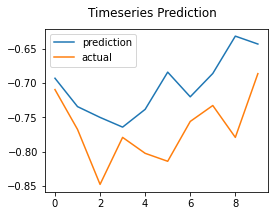

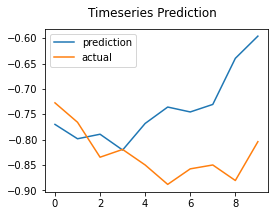

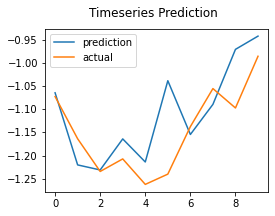

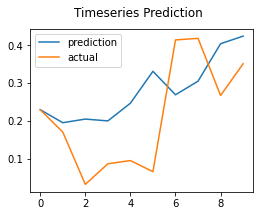

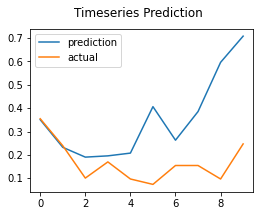

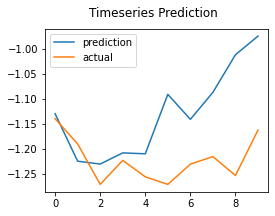

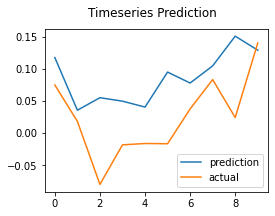

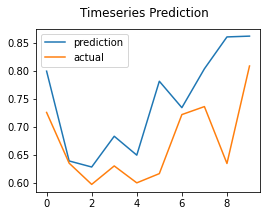

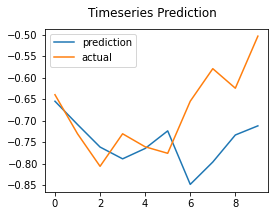

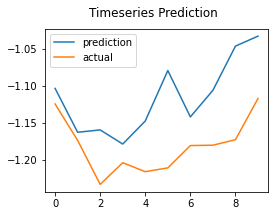

In [ ]:
for i in np.arange(100, 110):
    plt.figure(figsize=(4, 3))
    plt.plot(predictions[i], label='prediction')
    plt.plot(actuals[i], label='actual')
    plt.suptitle('Timeseries Prediction')
    plt.legend()
    plt.show()

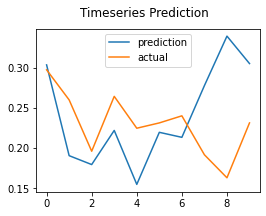

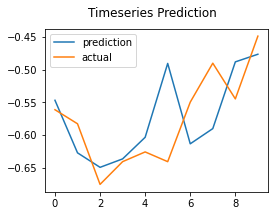

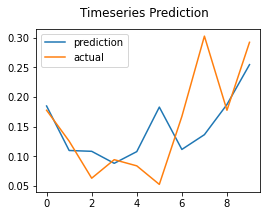

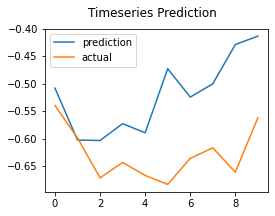

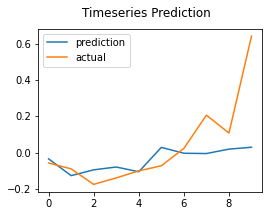

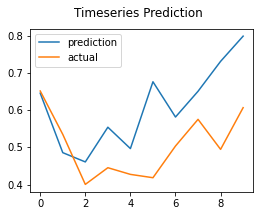

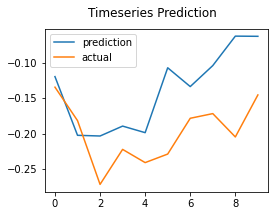

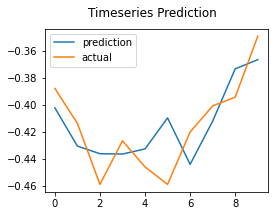

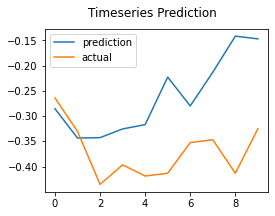

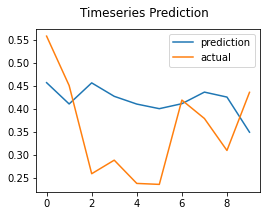

In [ ]:
for i in np.arange(170, 180):
    plt.figure(figsize=(4, 3))
    plt.plot(predictions[i], label='prediction')
    plt.plot(actuals[i], label='actual')
    plt.suptitle('Timeseries Prediction')
    plt.legend()
    plt.show()